Model loaded.
Classes: ['argentina', 'austria', 'canada', 'chile', 'france', 'iceland', 'italy', 'japan', 'new_zealand', 'norway', 'peru', 'switzerland']
Found 144 files belonging to 12 classes.


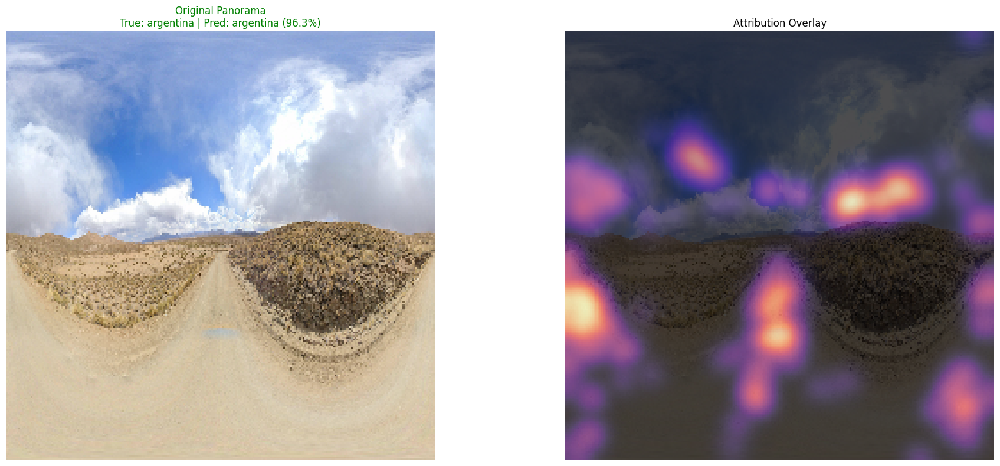

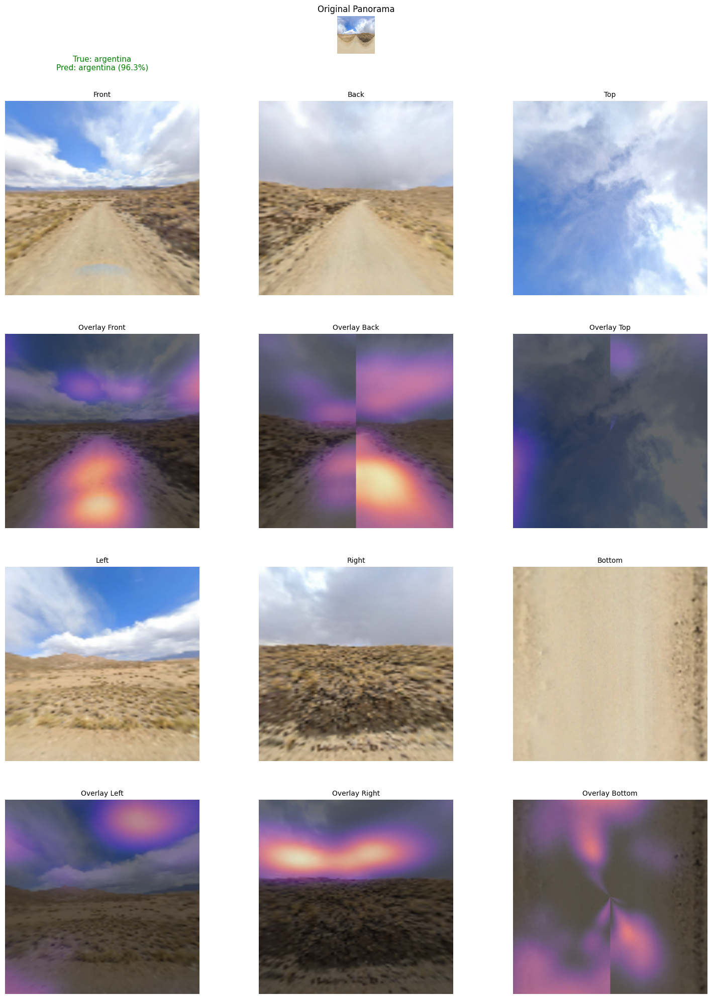

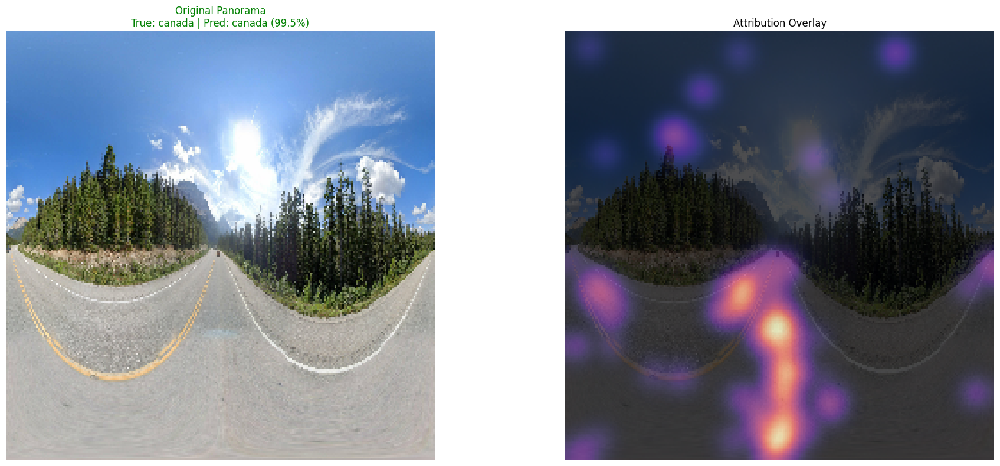

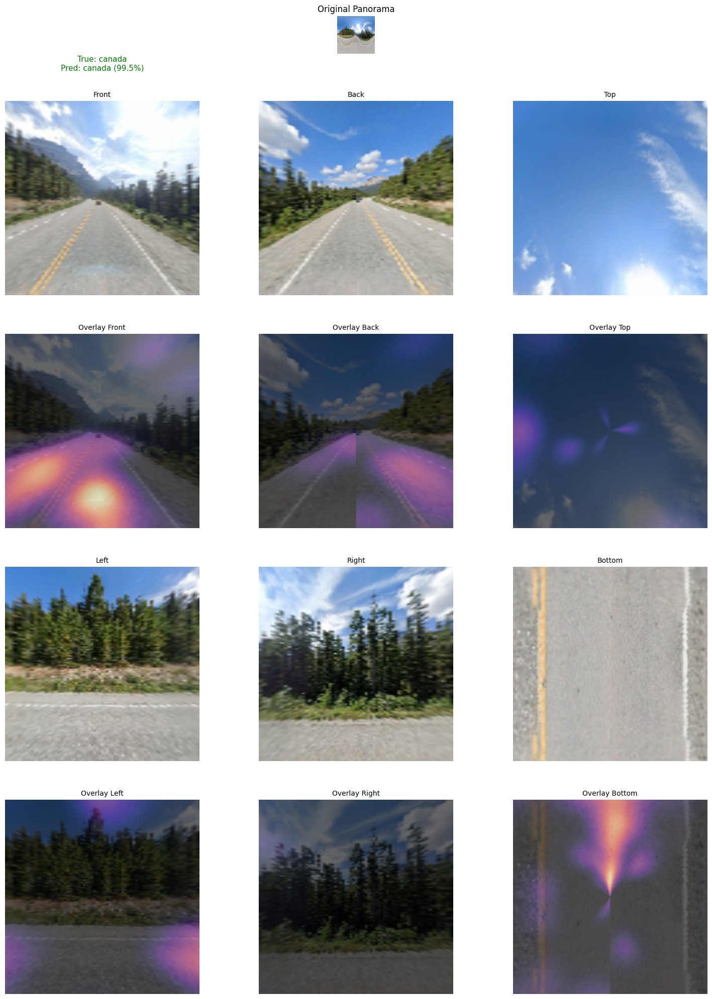

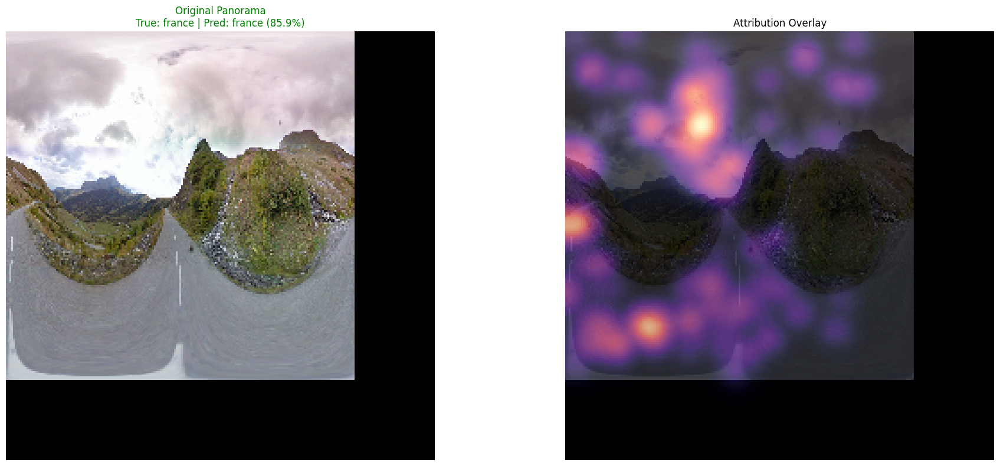

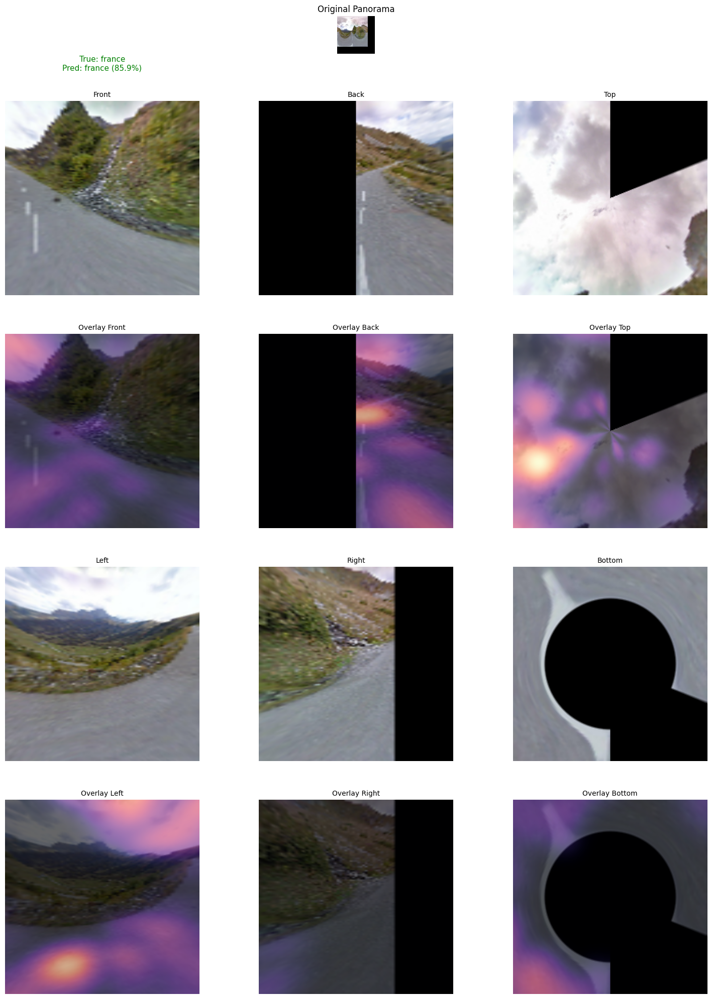

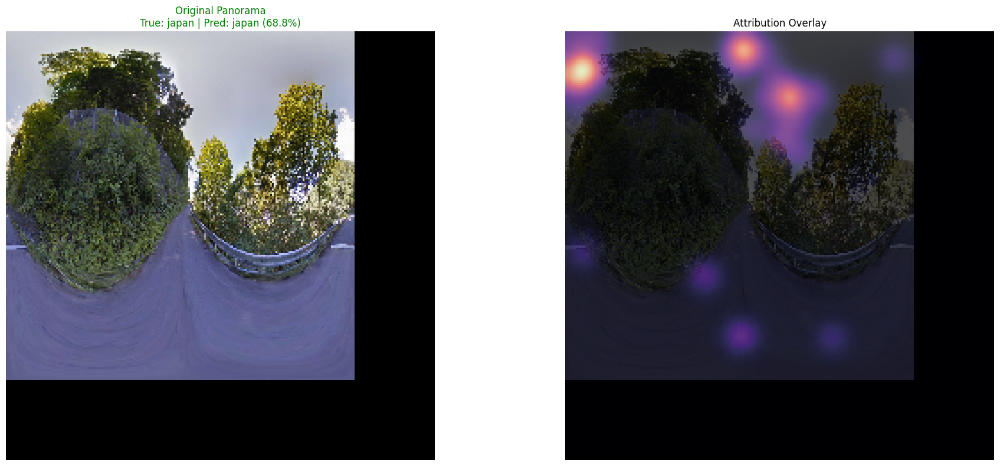

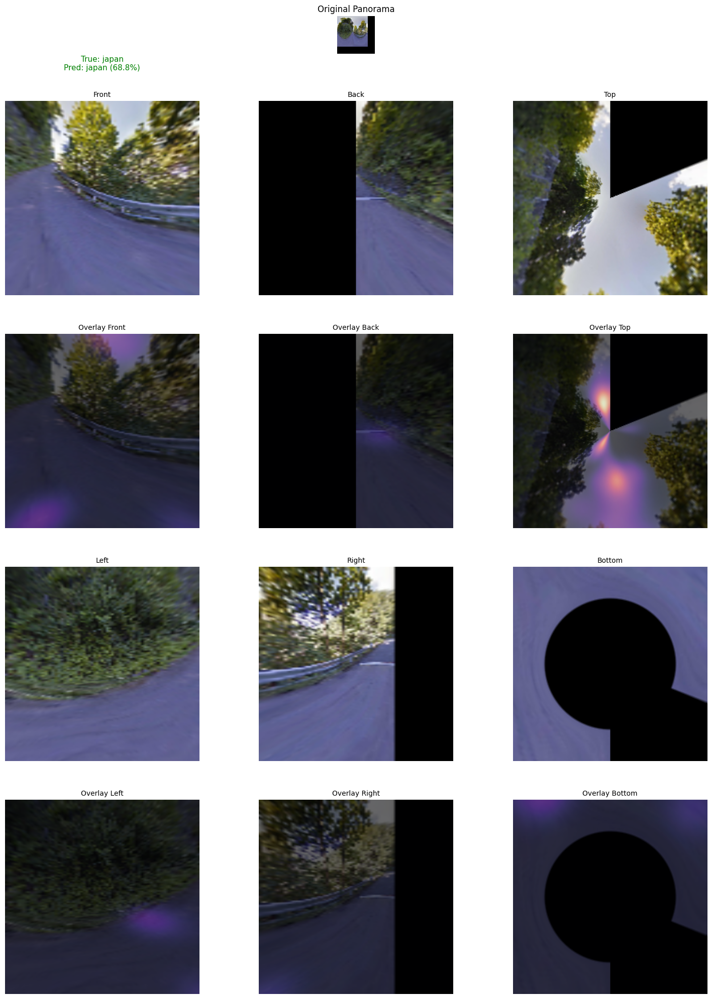

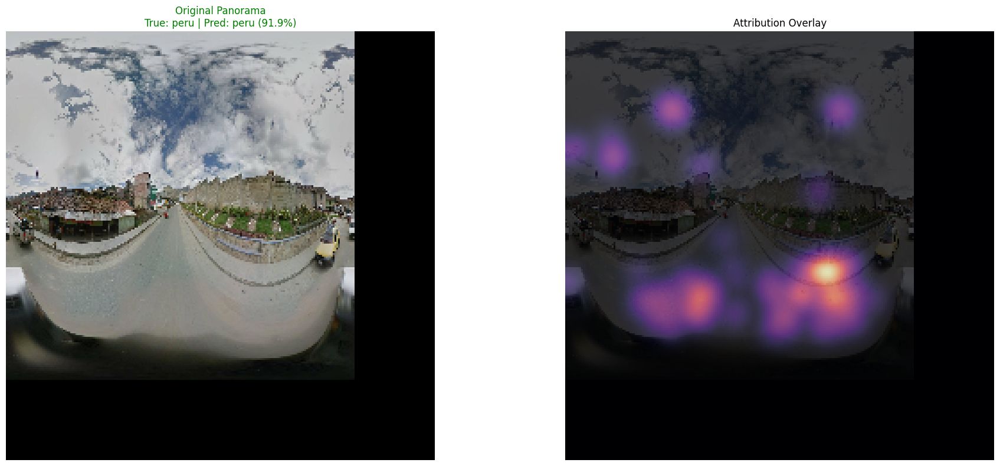

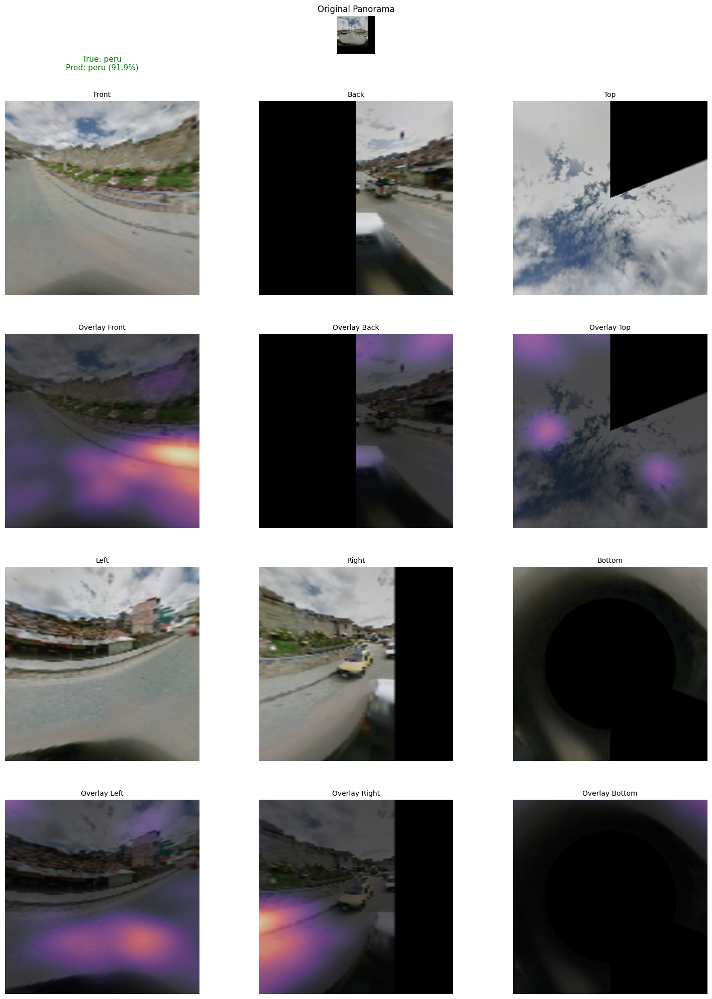

In [3]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
import cv2
from scipy import ndimage
import random


# === Config ===
MODEL_PATH = "C:/Users/diede/Downloads/AAB_ASS2_b1_augmented_blurred_finetuned_last30.h5"
DATA_DIR = "C:/Users/diede/Downloads/balanced_split_images"
TEST_PATH = os.path.join(DATA_DIR, "test")
MODEL_TARGET_SIZE = (240, 240)
GAUSSIAN_SIGMA = 5
ATTRIBUTION_THRESHOLD = 0.3
BATCH_SIZE = 32
NUM_RANDOM_IMAGES = 5
VISUALIZATION_DPI = 100

# === Custom Layer ===
class RandomBlurRegion(tf.keras.layers.Layer):
    def __init__(self, prob=0.25, min_size=60, max_size=120, num_regions=3, **kwargs):
        super().__init__(**kwargs)
        self.prob = prob
        self.min_size = min_size
        self.max_size = max_size
        self.num_regions = num_regions

    def call(self, inputs, training=None):
        return inputs

    def get_config(self):
        config = super().get_config()
        config.update({
            "prob": self.prob,
            "min_size": self.min_size,
            "max_size": self.max_size,
            "num_regions": self.num_regions
        })
        return config

# === Helper Functions ===
def apply_gaussian_blur_to_heatmap(attribution_map, sigma=GAUSSIAN_SIGMA):
    """Apply Gaussian blur to the attribution map and enhance visibility."""
    # Normalize the attribution map to [0, 1]
    attr_normalized = (attribution_map - np.min(attribution_map)) / (np.max(attribution_map) - np.min(attribution_map) + 1e-8)
    
    # Apply threshold to focus on more important regions
    attr_thresholded = np.where(attr_normalized > ATTRIBUTION_THRESHOLD, attr_normalized, 0)
    
    # Apply Gaussian blur
    attr_blurred = ndimage.gaussian_filter(attr_thresholded, sigma=sigma)
    
    # Renormalize after blurring
    attr_blurred = (attr_blurred - np.min(attr_blurred)) / (np.max(attr_blurred) - np.min(attr_blurred) + 1e-8)
    
    # Apply non-linear scaling to enhance mid-range values
    attr_enhanced = np.power(attr_blurred, 0.5)  # Square root to enhance mid-range values
    
    return attr_enhanced

def equirectangular_to_perspective(img, fov_deg, u_deg, v_deg, out_hw):
    """Projects an equirectangular image to a perspective view."""
    h_in, w_in = img.shape[:2]
    h_out, w_out = out_hw
    fov = np.radians(fov_deg)
    u = np.radians(u_deg)
    v = np.radians(v_deg)

    x = np.linspace(-w_out / 2, w_out / 2, w_out, dtype=np.float32)
    y = np.linspace(h_out / 2, -h_out / 2, h_out, dtype=np.float32)
    x, y = np.meshgrid(x, y)

    f = (w_out / 2) / np.tan(fov / 2)
    x_3d, y_3d, z_3d = x, y, np.full_like(x, f, dtype=np.float32)

    norm = np.sqrt(x_3d**2 + y_3d**2 + z_3d**2)
    norm[norm == 0] = 1e-6
    x_3d, y_3d, z_3d = x_3d / norm, y_3d / norm, z_3d / norm

    x_rotated = np.cos(u) * x_3d + np.sin(u) * z_3d
    y_rotated = y_3d
    z_rotated = -np.sin(u) * x_3d + np.cos(u) * z_3d

    x_final = x_rotated
    y_final = np.cos(v) * y_rotated - np.sin(v) * z_rotated
    z_final = np.sin(v) * y_rotated + np.cos(v) * z_rotated

    lon = np.arctan2(x_final, z_final)
    lat = np.arcsin(y_final)

    map_x = np.clip((lon / (2 * np.pi) + 0.5) * w_in, 0, w_in - 1)
    map_y = np.clip((-lat / np.pi + 0.5) * h_in, 0, h_in - 1)

    persp_img = cv2.remap(img, map_x.astype(np.float32), map_y.astype(np.float32),
                          interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_WRAP)
    return persp_img

def split_panorama(img_array, fov=90, view_hw=(256, 256), is_heatmap=False):
    """Splits a 360 panorama into six perspective views."""
    if not is_heatmap and img_array.dtype != np.uint8:
        img_array = (img_array * 255).astype(np.uint8) if img_array.max() <= 1.0 else img_array.astype(np.uint8)

    views = [
        equirectangular_to_perspective(img_array, fov, 0, 0, view_hw),    # Front
        equirectangular_to_perspective(img_array, fov, 90, 0, view_hw),   # Right
        equirectangular_to_perspective(img_array, fov, 180, 0, view_hw),  # Back
        equirectangular_to_perspective(img_array, fov, 270, 0, view_hw),  # Left
        equirectangular_to_perspective(img_array, fov, 0, -90, view_hw),  # Top
        equirectangular_to_perspective(img_array, fov, 0, 90, view_hw)    # Bottom
    ]
    return views

# === XRAI Attribution Function ===
def get_xrai_attribution(model, input_image_array, class_idx=None):
    """Generates XRAI-like attribution using gradients."""
    img_tensor = tf.convert_to_tensor(input_image_array, dtype=tf.float32)

    if img_tensor.shape[1:3] != MODEL_TARGET_SIZE:
         print(f"Warning: Input tensor shape {img_tensor.shape} doesn't match model target size {MODEL_TARGET_SIZE}.")
         img_tensor = tf.image.resize(img_tensor, MODEL_TARGET_SIZE)

    if class_idx is None:
        pred = model.predict(img_tensor, verbose=0)
        class_idx = np.argmax(pred[0])

    try:
        with tf.GradientTape() as tape:
            tape.watch(img_tensor)
            predictions = model(img_tensor, training=False)
            target_class_score = predictions[:, class_idx]

        gradients = tape.gradient(target_class_score, img_tensor)

        if gradients is None:
             print("  - Warning: Gradients are None. Check model architecture or target layer.")
             return np.zeros(MODEL_TARGET_SIZE)

        gradients_np = gradients.numpy()
        img_tensor_np = img_tensor.numpy()

        gradients_x_input = gradients_np * img_tensor_np
        saliency_map = np.mean(np.abs(gradients_x_input), axis=-1)[0]

        min_val, max_val = np.min(saliency_map), np.max(saliency_map)
        if max_val - min_val > 1e-8:
            saliency_map = (saliency_map - min_val) / (max_val - min_val)
        else:
            saliency_map = np.zeros_like(saliency_map)

        return saliency_map

    except Exception as e:
        print(f"  - Error in gradient computation: {e}")
        return np.zeros(MODEL_TARGET_SIZE)

# === Main Execution ===
# Load model with custom layer
model = tf.keras.models.load_model(MODEL_PATH, compile=False, custom_objects={"RandomBlurRegion": RandomBlurRegion})
print("Model loaded.")

# Get class names
class_names = sorted([d for d in os.listdir(TEST_PATH) if os.path.isdir(os.path.join(TEST_PATH, d))])
print("Classes:", class_names)

# Load test dataset
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_PATH,
    image_size=MODEL_TARGET_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=False
)

# Get file paths
file_paths_ds = tf.data.Dataset.list_files(os.path.join(TEST_PATH, "*", "*.jpg"), shuffle=False)
file_paths = list(file_paths_ds.as_numpy_iterator())

# Select random images and process them
random_indices = random.sample(range(len(file_paths)), NUM_RANDOM_IMAGES)
target_filenames = [os.path.basename(file_paths[i].decode("utf-8")) for i in random_indices]

# Find images in test_ds
found_images = []
for i, (images, labels) in enumerate(test_ds):
    batch_start = i * BATCH_SIZE
    batch_end = batch_start + images.shape[0]
    batch_paths = file_paths[batch_start:batch_end]

    for j, path in enumerate(batch_paths):
        filename = os.path.basename(path.decode("utf-8"))
        if filename in target_filenames:
            found_images.append((filename, images[j], labels[j]))
        if len(found_images) == NUM_RANDOM_IMAGES:
            break
    if len(found_images) == NUM_RANDOM_IMAGES:
        break

# === Visualization with XRAI ===
for idx, (filename, image, label) in enumerate(found_images):
    img_batch = tf.expand_dims(image, axis=0)
    preds = model.predict(img_batch, verbose=0)[0]
    pred_idx = np.argmax(preds)
    pred_label = class_names[pred_idx]
    confidence = preds[pred_idx] * 100
    true_label = class_names[tf.argmax(label).numpy()]

    # Get XRAI attribution map
    attribution = get_xrai_attribution(model, img_batch.numpy(), pred_idx)
    enhanced_attribution = apply_gaussian_blur_to_heatmap(attribution)

    # Create heatmap overlay
    heatmap = cm.magma(enhanced_attribution)[:, :, :3]
    heatmap_uint8 = (heatmap * 255).astype(np.uint8)

    # Create panorama views
    perspective_views = split_panorama(image.numpy(), fov=90, view_hw=(240, 240))
    attribution_views = split_panorama(heatmap_uint8, fov=90, view_hw=(240, 240), is_heatmap=True)

    # Create figure with two side-by-side panoramas
    fig1 = plt.figure(figsize=(20, 8))

    # Left subplot: Original panorama with prediction
    plt.subplot(1, 2, 1)
    plt.imshow(tf.clip_by_value(image / 255.0, 0, 1))
    title_color = 'green' if pred_idx == tf.argmax(label).numpy() else 'red'
    plt.title(f"Original Panorama\nTrue: {true_label} | Pred: {pred_label} ({confidence:.1f}%)", 
             color=title_color, fontsize=12)
    plt.axis('off')

    # Right subplot: Attribution overlay on panorama
    plt.subplot(1, 2, 2)
    plt.imshow(tf.clip_by_value(image / 255.0, 0, 1))
    plt.imshow(heatmap_uint8, alpha=0.7)
    plt.title("Attribution Overlay", fontsize=12)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Figure 2: Detailed perspective views
    fig2 = plt.figure(figsize=(15, 20))
    outer_gs = gridspec.GridSpec(5, 1, height_ratios=[1, 5, 5, 5, 5])

    # First row: Full panorama
    ax_pano = plt.subplot(outer_gs[0])
    ax_pano.imshow(tf.clip_by_value(image / 255.0, 0, 1))
    ax_pano.set_title(f"Original Panorama", fontsize=12)
    ax_pano.axis('off')

    # Rest of rows: perspective views
    inner_gs = gridspec.GridSpecFromSubplotSpec(4, 3, subplot_spec=outer_gs[1:], wspace=0.1, hspace=0.2)

    # Combine views and titles
    plot_views = {
        (0, 0): (perspective_views[0], 'Front'), 
        (0, 1): (perspective_views[2], 'Back'),
        (0, 2): (perspective_views[4], 'Top'),
        (1, 0): (perspective_views[0], attribution_views[0], 'Overlay Front'),
        (1, 1): (perspective_views[2], attribution_views[2], 'Overlay Back'),
        (1, 2): (perspective_views[4], attribution_views[4], 'Overlay Top'),
        (2, 0): (perspective_views[3], 'Left'),
        (2, 1): (perspective_views[1], 'Right'),
        (2, 2): (perspective_views[5], 'Bottom'),
        (3, 0): (perspective_views[3], attribution_views[3], 'Overlay Left'),
        (3, 1): (perspective_views[1], attribution_views[1], 'Overlay Right'),
        (3, 2): (perspective_views[5], attribution_views[5], 'Overlay Bottom'),
    }

    for grid_pos, plot_data in plot_views.items():
        row, col = grid_pos
        ax = plt.subplot(inner_gs[row, col])
        if len(plot_data) == 2:  # Original view
            img, title = plot_data
            ax.imshow(img)
            ax.set_title(title, fontsize=10)
        elif len(plot_data) == 3:  # Overlay view
            base_img, heatmap_img, title = plot_data
            ax.imshow(base_img)
            ax.imshow(heatmap_img, alpha=0.6)
            ax.set_title(title, fontsize=10)

        ax.axis('off')

        if grid_pos == (0, 0):  # Add prediction text to the plot
            title_color = 'green' if pred_idx == tf.argmax(label).numpy() else 'red'
            ax.text(0.5, 1.15, f"True: {true_label}\nPred: {pred_label} ({confidence:.1f}%)",
                    color=title_color, fontsize=11, ha='center', va='bottom', transform=ax.transAxes)

    plt.tight_layout()
    plt.show()